In [1]:
import pandas as pd
import torch
import random
import numpy as np
import torch.nn as nn
from torch.nn.utils.rnn import pad_sequence
from sklearn.model_selection import KFold
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torch.utils.data import Sampler

df = pd.read_csv("../data/csr_embeddings_leq2019_filled_citation_count_cpc.csv")

## Seed

In [2]:
def set_seed(seed=42):
    random.seed(seed) # 控制 Python 內建的 random 模組（例如 random.shuffle()、random.randint()）。
    np.random.seed(seed) # 控制 NumPy 所有隨機操作（例如 np.random.rand()、np.random.shuffle()）。
    torch.manual_seed(seed) # 控制 CPU 上 PyTorch 的隨機性（例如 torch.rand()）。
    torch.cuda.manual_seed(seed)  # for CUDA
    torch.cuda.manual_seed_all(seed)  # for multi-GPU

    torch.backends.cudnn.deterministic = True  # 強制使用 deterministic（確定性）版本的 CuDNN 操作，避免某些 kernel 造成非一致性輸出。
    torch.backends.cudnn.benchmark = False     # 關閉 CuDNN 根據輸入自動選最佳演算法的機制，避免因選到不同 kernel 而有不同結果。

set_seed(42)

In [3]:
df

,file_name,dim_0,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,...,dim_1018,dim_1019,dim_1020,dim_1021,dim_1022,dim_1023,ticker,year,total_5yr_forward_citations,patents_count
0,NASDAQ_AAPL_2014,-0.091830,0.293040,-0.179719,0.083607,-0.032453,0.012720,-0.027948,0.030055,0.105388,...,0.290067,-0.223406,-0.325722,0.009091,-0.170071,0.163041,AAPL,2014,772.0,110.0
1,NASDAQ_AAPL_2015,-0.085034,0.276596,-0.139275,0.068203,-0.015527,-0.055515,-0.033100,0.032737,0.124428,...,0.292318,-0.212523,-0.331629,-0.030166,-0.150414,0.180043,AAPL,2015,916.0,122.0
2,NASDAQ_AAPL_2016,-0.067159,0.277524,-0.148442,0.092723,-0.000616,-0.040362,-0.032554,0.009260,0.143966,...,0.296767,-0.216122,-0.327691,-0.037364,-0.151454,0.178229,AAPL,2016,901.0,123.0
3,NASDAQ_AAPL_2017,-0.053141,0.259755,-0.160064,0.098964,-0.006857,-0.001506,-0.052370,0.012755,0.146752,...,0.284501,-0.213012,-0.317366,-0.034005,-0.147262,0.175490,AAPL,2017,809.0,96.0
4,NASDAQ_AAPL_2018,-0.070878,0.338528,-0.095608,0.093072,-0.027314,-0.033892,-0.052765,0.021670,0.055076,...,0.274357,-0.190008,-0.347579,-0.004540,-0.125971,0.124562,AAPL,2018,404.0,89.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,NYSE_XRX_2017,-0.116771,0.273073,0.085469,-0.172837,-0.261041,-0.295415,-0.034079,0.221862,0.033038,...,0.342520,-0.213148,-0.552106,-0.062122,-0.010183,0.144048,XRX,2017,56.0,6.0
1595,NYSE_XRX_2018,-0.120495,0.256214,-0.124283,-0.008754,-0.040228,0.083673,-0.134553,-0.033440,0.127288,...,0.347586,-0.078939,-0.259030,0.024605,-0.203625,0.167591,XRX,2018,0.0,0.0
1596,NYSE_XRX_2019,-0.107306,0.273209,-0.103959,-0.001074,-0.034088,0.069932,-0.120183,-0.036632,0.132176,...,0.369505,-0.079411,-0.255776,0.003702,-0.204953,0.158863,XRX,2019,0.0,0.0
1597,NYSE_XYL_2018,-0.128076,0.242467,-0.105685,-0.002712,-0.121495,0.049107,-0.150115,0.002445,0.126636,...,0.374914,-0.140273,-0.278945,-0.068210,-0.167383,0.143690,XYL,2018,4.0,1.0


## Dataset

In [4]:
class SimpleCSRDataset(torch.utils.data.Dataset):
    def __init__(self, df):
        self.x = torch.tensor(df[[f'dim_{i}' for i in range(1024)]].values, dtype=torch.float32)
        y = df[['patents_count', 'total_5yr_forward_citations']].values
        self.y = torch.tensor(y, dtype=torch.float32)
        self.indexes = df.index.tolist()

    def __len__(self):
        return len(self.x)

    def __getitem__(self, idx):
        return self.x[idx], self.y[idx], self.indexes[idx]

## Model

In [5]:
class MLP_MTL(nn.Module):
    def __init__(self, input_dim=1024, hidden_dim=512, head_dim=64):
        super().__init__()
        self.shared = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(hidden_dim, head_dim),
            nn.ReLU()
        )
        self.head_count = nn.Sequential(nn.Linear(head_dim, 1))
        self.head_citation = nn.Sequential(nn.Linear(head_dim, 1))

    def forward(self, x):  # x: [B, 1024]
        shared_out = self.shared(x)
        y1 = self.head_count(shared_out)
        y2 = self.head_citation(shared_out)
        return torch.cat([y1, y2], dim=1)  # [B, 2]

## Evaluation metrics

In [6]:
def compute_metrics(y_pred, y_true):
    y_pred = y_pred.cpu().numpy()
    y_true = y_true.cpu().numpy()
    
    metrics = {}
    for i, name in enumerate(["count", "citation"]):
        y_p, y_t = y_pred[:, i], y_true[:, i]
        mse = np.mean((y_p - y_t) ** 2)
        mae = np.mean(np.abs(y_p - y_t))
        rmse = np.sqrt(mse)
        smape = np.mean(2 * np.abs(y_p - y_t) / (np.abs(y_p) + np.abs(y_t) + 1e-8)) * 100
        metrics[name] = {"MSE": mse, "MAE": mae, "RMSE": rmse, "SMAPE": smape}
    return metrics


## Loss function

In [7]:
class MSEPunishLoss(nn.Module):
    def __init__(self, alpha=1.0, punish_mode='', return_each=False):
        """
        :param alpha: 懲罰項權重
        :param punish_mode: 'abs', 'square', 'binary', 'huber', 'ratio', 'threshold'
        :param return_each: 是否回傳 count loss 和 citation loss
        """
        super().__init__()
        self.mse = nn.MSELoss()
        self.alpha = alpha
        self.punish_mode = punish_mode
        self.return_each = return_each

    def forward(self, preds, targets):
        pred_count, pred_citation = preds[:, 0], preds[:, 1]
        true_count, true_citation = targets[:, 0], targets[:, 1]

        loss_count = self.mse(pred_count, true_count)
        loss_citation = self.mse(pred_citation, true_citation)
        loss_total = loss_count + loss_citation

        # Initialize punishment
        punishment = 0.0

        if self.punish_mode:
            mask = (true_count == 0)
            if mask.sum() > 0:
                if self.punish_mode == 'abs':
                    punishment = torch.sum(torch.abs(pred_citation[mask]))
                elif self.punish_mode == 'square':
                    punishment = torch.sum((pred_citation[mask]) ** 2)
                elif self.punish_mode == 'binary':
                    punishment = torch.sum((pred_citation[mask] > 1e-4).float())
                elif self.punish_mode == 'huber':
                    punishment = nn.functional.smooth_l1_loss(
                        pred_citation[mask],
                        torch.zeros_like(pred_citation[mask]),
                        reduction='sum'
                    )
                elif self.punish_mode == 'ratio':
                    safe_count = true_count + 1e-6
                    ratio = pred_citation / safe_count
                    punishment = torch.sum(ratio[mask])
                elif self.punish_mode == 'threshold':
                    threshold = 1.0
                    over = torch.clamp(pred_citation[mask] - threshold, min=0)
                    punishment = torch.sum(over)
                else:
                    raise ValueError(f"Unsupported punish_mode: {self.punish_mode}")

        loss_total = loss_total + self.alpha * punishment

        if self.return_each:
            return loss_total, loss_count.item(), loss_citation.item()
        else:
            return loss_total

## StratifiedKFold

In [8]:
from sklearn.model_selection import StratifiedKFold

company_df = df.groupby('ticker')[['patents_count', 'total_5yr_forward_citations']].mean().reset_index()

# Step 1: 建立 count 是否為 0 的 flag
company_df['has_patents'] = (company_df['patents_count'] > 0).astype(int)

# Step 2: 對 citation 進行分箱（只對有產出的公司分）
bins = [-1, 0, 10, 50, 200, np.inf]
company_df['citation_bin'] = pd.cut(company_df['total_5yr_forward_citations'], bins=bins, labels=False)

# Step 3: 建立綜合 stratify 標籤
# 沒有產出的公司統一為 0，有產出者根據 citation_bin 分層
company_df['stratify_label'] = company_df.apply(
    lambda row: 0 if row['has_patents'] == 0 else row['citation_bin'] + 1,
    axis=1
)

stratified_kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

folds = []
for train_idx, test_idx in stratified_kf.split(company_df['ticker'], company_df['stratify_label']):
    train_coms = company_df.iloc[train_idx]['ticker'].values
    test_coms = company_df.iloc[test_idx]['ticker'].values
    folds.append((train_coms, test_coms))


/home/francia/anaconda3/envs/csr_env/lib/python3.10/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


In [9]:
for i, (_, test_coms) in enumerate(folds):
    sub_df = df[df['ticker'].isin(test_coms)]

    # Citation 統計
    mean_cit = sub_df['total_5yr_forward_citations'].mean()
    std_cit = sub_df['total_5yr_forward_citations'].std()
    max_cit = sub_df['total_5yr_forward_citations'].max()

    # Count 統計
    mean_cnt = sub_df['patents_count'].mean()
    std_cnt = sub_df['patents_count'].std()
    max_cnt = sub_df['patents_count'].max()

    # 無專利公司比例
    company_level = sub_df.groupby('ticker')['patents_count'].sum().reset_index()
    no_patent_ratio = (company_level['patents_count'] == 0).mean() * 100

    print(f"[Fold {i+1}]")
    print(f"  Citation → mean: {mean_cit:.2f} | std: {std_cit:.2f} | max: {max_cit:.2f}")
    print(f"  Count    → mean: {mean_cnt:.2f} | std: {std_cnt:.2f} | max: {max_cnt:.2f}")
    print(f"  % Companies with NO patents: {no_patent_ratio:.1f}%")

[Fold 1]
  Citation → mean: 50.77 | std: 243.61 | max: 2880.00
  Count    → mean: 3.69 | std: 8.88 | max: 71.00
  % Companies with NO patents: 34.4%
[Fold 2]
  Citation → mean: 47.96 | std: 186.47 | max: 1929.00
  Count    → mean: 5.88 | std: 20.24 | max: 160.00
  % Companies with NO patents: 32.8%
[Fold 3]
  Citation → mean: 59.76 | std: 251.53 | max: 2519.00
  Count    → mean: 9.92 | std: 42.81 | max: 381.00
  % Companies with NO patents: 32.8%
[Fold 4]
  Citation → mean: 53.79 | std: 188.17 | max: 1594.00
  Count    → mean: 8.52 | std: 32.15 | max: 312.00
  % Companies with NO patents: 35.0%
[Fold 5]
  Citation → mean: 24.40 | std: 112.28 | max: 1264.00
  Count    → mean: 2.22 | std: 6.36 | max: 73.00
  % Companies with NO patents: 35.0%


## Training

In [ ]:
## Training
# --- Training Config ---
## 5-fold Cross Validation
company_ids = df['ticker'].unique()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

epochs = 100
learning_rate = 1e-4

# 初始化儲存所有 fold 的 loss
all_train_losses_total = []
all_train_losses_count = []
all_train_losses_citation = []

all_val_losses_total = []
all_val_losses_count = []
all_val_losses_citation = []

all_val_preds_total = []
all_val_targets_total = []
all_val_meta_info_total = []  
best_epoch_list = []

for fold_id, (train_coms, test_coms) in enumerate(folds):
    print(f"\n====== Fold {fold_id+1} ======")

    fold_val_preds_epochs = []
    fold_val_targets_epochs = []
    fold_val_meta_epochs = []
    
    # Dataset   
    train_df = df[df['ticker'].isin(train_coms)].copy()
    val_df = df[df['ticker'].isin(test_coms)].copy()

    train_dataset = SimpleCSRDataset(train_df)
    val_dataset = SimpleCSRDataset(val_df)


    generator = torch.Generator().manual_seed(42)

    # DataLoader
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=lambda x: x, generator=generator)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, collate_fn=lambda x: x)

    # Model
    model = MLP_MTL().to(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
    criterion = MSEPunishLoss(alpha=1.0, punish_mode='', return_each=True)

    # 儲存每個 epoch 的 loss（每 fold 一份）
    train_loss_total_list, train_loss_count_list, train_loss_citation_list = [], [], []
    val_loss_total_list, val_loss_count_list, val_loss_citation_list = [], [], []

    # <-- Early Stopping 初始化 -->
    best_val_loss = float('inf')
    epochs_no_improve = 0
    patience = 50
    best_model_state = None
    best_epoch = None  

    for epoch in range(epochs):
        model.train()
        epoch_losses = []
        epoch_loss_count_all = []
        epoch_loss_citation_all = []
        for batch in train_loader:
            x, y, idxs = zip(*batch)
            x = torch.stack(x).to(device)
            y = torch.stack(y).to(device)

            preds = model(x)

            loss_total, loss_count, loss_citation = criterion(preds, y)
            optimizer.zero_grad()
            loss_total.backward()
            optimizer.step()

            epoch_losses.append(loss_total.item())
            epoch_loss_count_all.append(loss_count)
            epoch_loss_citation_all.append(loss_citation)

            # # ✔ 每個 batch 印 loss、predictions、truth
            # print(f"[Fold {fold_id+1}][Epoch {epoch+1}][Train][Batch] Company: {tickers[0]} | Samples: {len(indices)}")
            # print(f"  Total Loss: {loss_total.item():.4f} | Count Loss: {loss_count:.4f} | Citation Loss: {loss_citation:.4f}")
            # print(f"  Predictions (expm1, rounded): {np.round(torch.expm1(preds).detach().cpu().numpy())}")
            # print(f"  Ground truth (expm1, rounded): {np.round(torch.expm1(y).detach().cpu().numpy())}")
            # print(f"  Indices: {indices}")

        avg_train_loss = np.mean(epoch_losses)
        avg_train_count = np.mean(epoch_loss_count_all)
        avg_train_citation = np.mean(epoch_loss_citation_all)

        train_loss_total_list.append(avg_train_loss)
        train_loss_count_list.append(avg_train_count)
        train_loss_citation_list.append(avg_train_citation)

        # Validation
        model.eval()
        with torch.no_grad():
            val_losses = []
            val_loss_count_all = []
            val_loss_citation_all = []
            all_preds = []
            all_y = []
            val_meta_info = []  # <--- 新增：本 epoch 的 meta 資訊
            for batch_id, batch in enumerate(val_loader):
                x, y, idxs = zip(*batch)
                x = torch.stack(x).to(device)
                y = torch.stack(y).to(device)

                preds = model(x)
                loss_total, loss_count, loss_citation = criterion(preds, y)
                
                val_losses.append(loss_total.item())
                val_loss_count_all.append(loss_count)
                val_loss_citation_all.append(loss_citation)

                all_preds.append(preds)
                all_y.append(y)

                # 💾 新增：記錄每一筆的 fold / epoch / batch / sample index
                for i, index in enumerate(idxs):
                    val_meta_info.append({
                        "fold": fold_id + 1,
                        "epoch": epoch + 1,
                        "batch": batch_id + 1,
                        "sample": i,
                        "index": index  # 原始 index 儲存以便後續追蹤
                    })

                # ✔ 每個 batch 印 loss、predictions、truth
                print(f"[Fold {fold_id+1}][Epoch {epoch+1}][Val][Batch] | Samples: {len(x)}")
                print(f"  Total Loss: {loss_total.item():.4f} | Count Loss: {loss_count:.4f} | Citation Loss: {loss_citation:.4f}")
                print(f"  Predictions (restored, rounded): {np.round(preds.cpu().numpy())}")
                print(f"  Ground truth (restored, rounded): {np.round(y.cpu().numpy())}")
                print(f"  Indices: {idxs}")

            fold_val_preds_epochs.append(torch.cat(all_preds).cpu())
            fold_val_targets_epochs.append(torch.cat(all_y).cpu())
            fold_val_meta_epochs.append(val_meta_info)

            avg_val_loss = np.mean(val_losses)
            avg_val_count = np.mean(val_loss_count_all)
            avg_val_citation = np.mean(val_loss_citation_all)

            val_loss_total_list.append(avg_val_loss)
            val_loss_count_list.append(avg_val_count)
            val_loss_citation_list.append(avg_val_citation)

            all_preds = torch.cat(all_preds)
            all_y = torch.cat(all_y)

            # ✔ 每個 epoch 最後 summary
            print(f"[Fold {fold_id+1}][Epoch {epoch+1}] Summary")
            print(f"  Train Avg Loss     -> Total: {avg_train_loss:.4f} | Count: {avg_train_count:.4f} | Citation: {avg_train_citation:.4f}")
            print(f"  Validation Avg Loss-> Total: {avg_val_loss:.4f} | Count: {avg_val_count:.4f} | Citation: {avg_val_citation:.4f}")

        metrics = compute_metrics(all_preds, all_y)
        for name, vals in metrics.items():
            print(f"  [{name.upper()}] Metrics -> MSE: {vals['MSE']:.4f} | MAE: {vals['MAE']:.4f} | "
                f"RMSE: {vals['RMSE']:.4f} | SMAPE: {vals['SMAPE']:.2f}%")

        # <-- Early Stopping 判斷 -->
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
            best_model_state = model.state_dict()
            best_epoch = epoch
            print(f"  ✅ Validation loss improved. Saving model.")
        else:
            epochs_no_improve += 1
            print(f"  ❌ No improvement. Patience: {epochs_no_improve}/{patience}")

        if epochs_no_improve >= patience:
            print(f"  ⏹ Early stopping triggered at epoch {epoch+1}. Best val_loss: {best_val_loss:.4f}")
            break
        print(f"  🔄 Best model loaded from epoch {best_epoch}")

    # 還原最佳模型狀態（可選）
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print("  🔄 Best model loaded for final evaluation or saving.")

    # 每個 fold 儲存進總表中
    all_train_losses_total.append(train_loss_total_list)
    all_train_losses_count.append(train_loss_count_list)
    all_train_losses_citation.append(train_loss_citation_list)

    all_val_losses_total.append(val_loss_total_list)
    all_val_losses_count.append(val_loss_count_list)
    all_val_losses_citation.append(val_loss_citation_list)

    all_val_preds_total.append(fold_val_preds_epochs)
    all_val_targets_total.append(fold_val_targets_epochs)
    all_val_meta_info_total.append(fold_val_meta_epochs)

    best_epoch_list.append(best_epoch + 1)  # 儲存最佳 epoch（從 1 開始）


====== Fold 1 ======


[Fold 1][Epoch 1][Val][Batch] | Samples: 16
  Total Loss: 356.9366 | Count Loss: 1.7473 | Citation Loss: 355.1893


TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

# Save validation result to csv

In [ ]:
import pandas as pd
import numpy as np
import torch

val_summary_records = []

for fold_id in range(len(folds)):
    best_epoch_id = best_epoch_list[fold_id]

    fold_preds = all_val_preds_total[fold_id][best_epoch_id]
    fold_targets = all_val_targets_total[fold_id][best_epoch_id]
    fold_meta_info = all_val_meta_info_total[fold_id][best_epoch_id]

    y_pred = fold_preds.numpy()
    y_true = fold_targets.numpy()

    for i, meta in enumerate(fold_meta_info):
        true_count = y_true[i, 0]
        pred_count = y_pred[i, 0]
        true_citation = y_true[i, 1]
        pred_citation = y_pred[i, 1]

        count_mse = (pred_count - true_count) ** 2
        count_mae = abs(pred_count - true_count)
        count_smape = 2 * count_mae / (abs(pred_count) + abs(true_count) + 1e-8)

        citation_mse = (pred_citation - true_citation) ** 2
        citation_mae = abs(pred_citation - true_citation)
        citation_smape = 2 * citation_mae / (abs(pred_citation) + abs(true_citation) + 1e-8)

        epoch = meta["epoch"]
        fold_val_losses_total = all_val_losses_total[fold_id]
        fold_val_losses_count = all_val_losses_count[fold_id]
        fold_val_losses_citation = all_val_losses_citation[fold_id]
        epoch_loss_total = fold_val_losses_total[epoch - 1]
        epoch_loss_count = fold_val_losses_count[epoch - 1]
        epoch_loss_citation = fold_val_losses_citation[epoch - 1]

        val_summary_records.append({
            "fold": meta["fold"],
            "epoch": epoch,
            "batch": meta["batch"],
            "local_sample": meta["sample"],
            "index": meta["index"],
            "true_count": round(true_count, 4),
            "pred_count": round(pred_count, 4),
            "true_citation": round(true_citation, 4),
            "pred_citation": round(pred_citation, 4),
            "val_loss_total": round(epoch_loss_total, 4),
            "val_loss_count": round(epoch_loss_count, 4),
            "val_loss_citation": round(epoch_loss_citation, 4),
            "count_MSE": round(count_mse, 4),
            "count_MAE": round(count_mae, 4),
            "count_SMAPE": round(count_smape, 4),
            "citation_MSE": round(citation_mse, 4),
            "citation_MAE": round(citation_mae, 4),
            "citation_SMAPE": round(citation_smape, 4),
        })

# 儲存 CSV
val_summary_df = pd.DataFrame(val_summary_records)
val_summary_df.to_csv("../output/mlp_mtl_v2_val_loss_and_predictions_detailed.csv", index=False)
print("✅ Saved detailed validation results to 'val_loss_and_predictions_detailed.csv'")

/tmp/ipykernel_523445/2480264300.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return (tensor * std_array) + mean_array


✅ Saved detailed validation results to 'val_loss_and_predictions_detailed.csv'


In [ ]:
print("\n====== Final Summary: Each Fold's Avg Loss (per Y) ======")
for fold_id in range(len(folds)):
    avg_train_count = np.mean(all_train_losses_count[fold_id])
    avg_train_citation = np.mean(all_train_losses_citation[fold_id])
    avg_val_count = np.mean(all_val_losses_count[fold_id])
    avg_val_citation = np.mean(all_val_losses_citation[fold_id])
    
    print(f"[Fold {fold_id+1}]")
    print(f"  Train  -> Count Loss: {avg_train_count:.4f} | Citation Loss: {avg_train_citation:.4f}")
    print(f"  Valid  -> Count Loss: {avg_val_count:.4f} | Citation Loss: {avg_val_citation:.4f}")

# 全部 fold 加總平均
mean_train_count = np.mean([np.mean(x) for x in all_train_losses_count])
mean_train_citation = np.mean([np.mean(x) for x in all_train_losses_citation])
mean_val_count = np.mean([np.mean(x) for x in all_val_losses_count])
mean_val_citation = np.mean([np.mean(x) for x in all_val_losses_citation])

print("\n====== Final Overall Avg Loss Across 5 Folds ======")
print(f"Train  -> Count Loss: {mean_train_count:.4f} | Citation Loss: {mean_train_citation:.4f}")
print(f"Valid  -> Count Loss: {mean_val_count:.4f} | Citation Loss: {mean_val_citation:.4f}")



====== Final Summary: Each Fold's Avg Loss (per Y) ======
[Fold 1]
  Train  -> Count Loss: 0.7452 | Citation Loss: 0.5487
  Valid  -> Count Loss: 0.1743 | Citation Loss: 1.4649
[Fold 2]
  Train  -> Count Loss: 0.6073 | Citation Loss: 0.7499
  Valid  -> Count Loss: 0.3533 | Citation Loss: 0.4899
[Fold 3]
  Train  -> Count Loss: 0.2783 | Citation Loss: 0.5536
  Valid  -> Count Loss: 2.4523 | Citation Loss: 1.3255
[Fold 4]
  Train  -> Count Loss: 0.4946 | Citation Loss: 0.7353
  Valid  -> Count Loss: 1.1285 | Citation Loss: 0.5504
[Fold 5]
  Train  -> Count Loss: 0.7483 | Citation Loss: 0.8204
  Valid  -> Count Loss: 0.2277 | Citation Loss: 0.3263

====== Final Overall Avg Loss Across 5 Folds ======
Train  -> Count Loss: 0.5748 | Citation Loss: 0.6816
Valid  -> Count Loss: 0.8672 | Citation Loss: 0.8314


In [ ]:
import numpy as np
import torch

# 合併所有 fold 的預測與 meta 資訊
y_pred_all = torch.cat([torch.cat(fold) for fold in all_val_preds_total])
y_true_all = torch.cat([torch.cat(fold) for fold in all_val_targets_total])
meta_all = [meta for fold in all_val_meta_info_total for epoch in fold for meta in epoch]

# 計算每筆樣本的誤差
abs_error = np.abs(y_pred_all - y_true_all)
squared_error = (y_pred_all - y_true_all) ** 2
rmse_error = np.sqrt(squared_error)
smape = 2 * abs_error / (np.abs(y_pred_all) + np.abs(y_true_all) + 1e-8)

# 印出所有資料（可改成 range(50) 減少輸出）
print("\n===== Detailed Per-Sample Metric with Meta Info =====")
for i in range(len(y_true_all)):
    meta = meta_all[i]
    print(f"\n[Sample {i}] [Fold {meta['fold']}][Epoch {meta['epoch']}][Batch {meta['batch']}][Local Sample {meta['sample']}] Index: {meta['index']}")
    print(f"  COUNT    -> True: {y_true_all[i, 0]:.2f}, Pred: {y_pred_all[i, 0]:.2f}")
    print(f"              MSE: {squared_error[i, 0]:.4f}, MAE: {abs_error[i, 0]:.4f}, RMSE: {rmse_error[i, 0]:.4f}, SMAPE: {smape[i, 0]*100:.2f}%")
    print(f"  CITATION -> True: {y_true_all[i, 1]:.2f}, Pred: {y_pred_all[i, 1]:.2f}")
    print(f"              MSE: {squared_error[i, 1]:.4f}, MAE: {abs_error[i, 1]:.4f}, RMSE: {rmse_error[i, 1]:.4f}, SMAPE: {smape[i, 1]*100:.2f}%")



===== Detailed Per-Sample Metric with Meta Info =====

[Sample 0] [Fold 1][Epoch 1][Batch 1][Local Sample 0] Index: 47
  COUNT    -> True: 0.00, Pred: 4.03
              MSE: 16.2467, MAE: 4.0307, RMSE: 4.0307, SMAPE: 200.00%
  CITATION -> True: -0.00, Pred: 30.53
              MSE: 931.9576, MAE: 30.5280, RMSE: 30.5280, SMAPE: 200.00%

[Sample 1] [Fold 1][Epoch 1][Batch 1][Local Sample 1] Index: 48
  COUNT    -> True: 0.00, Pred: 4.26
              MSE: 18.1309, MAE: 4.2580, RMSE: 4.2580, SMAPE: 200.00%
  CITATION -> True: -0.00, Pred: 31.22
              MSE: 974.9813, MAE: 31.2247, RMSE: 31.2247, SMAPE: 200.00%

[Sample 2] [Fold 1][Epoch 1][Batch 1][Local Sample 2] Index: 49
  COUNT    -> True: 0.00, Pred: 3.82
              MSE: 14.5628, MAE: 3.8161, RMSE: 3.8161, SMAPE: 200.00%
  CITATION -> True: -0.00, Pred: 28.51
              MSE: 813.0942, MAE: 28.5148, RMSE: 28.5148, SMAPE: 200.00%

[Sample 3] [Fold 1][Epoch 1][Batch 1][Local Sample 3] Index: 50
  COUNT    -> True: 1.00, Pr

/tmp/ipykernel_523445/2480264300.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return (tensor * std_array) + mean_array
/tmp/ipykernel_523445/72321928.py:14: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  abs_error = np.abs(y_pred - y_true)
/tmp/ipykernel_523445/72321928.py:16: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  rmse_error = np.sqrt(squared_error)
/tmp/ipykernel_523445/72321928.py:17: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  smape = 2 * abs_error / (np.abs(y_pred) + np.abs(y_true) + 1e-8)


              MSE: 0.0483, MAE: 0.2198, RMSE: 0.2198, SMAPE: 24.70%
  CITATION -> True: 10.00, Pred: 14.41
              MSE: 19.4159, MAE: 4.4064, RMSE: 4.4064, SMAPE: 36.11%

[Sample 4978] [Fold 1][Epoch 15][Batch 20][Local Sample 12] Index: 1419
  COUNT    -> True: 0.00, Pred: 4.40
              MSE: 19.3387, MAE: 4.3976, RMSE: 4.3976, SMAPE: 200.00%
  CITATION -> True: -0.00, Pred: 41.10
              MSE: 1689.5713, MAE: 41.1044, RMSE: 41.1044, SMAPE: 200.00%

[Sample 4979] [Fold 1][Epoch 15][Batch 20][Local Sample 13] Index: 1420
  COUNT    -> True: 1.00, Pred: 4.95
              MSE: 15.6367, MAE: 3.9543, RMSE: 3.9543, SMAPE: 132.82%
  CITATION -> True: 3.00, Pred: 44.75
              MSE: 1743.0630, MAE: 41.7500, RMSE: 41.7500, SMAPE: 174.87%

[Sample 4980] [Fold 1][Epoch 15][Batch 20][Local Sample 14] Index: 1421
  COUNT    -> True: 0.00, Pred: 3.17
              MSE: 10.0655, MAE: 3.1726, RMSE: 3.1726, SMAPE: 200.00%
  CITATION -> True: -0.00, Pred: 30.86
              MSE: 9

  COUNT    -> True: 4.00, Pred: 3.72
              MSE: 0.0805, MAE: 0.2837, RMSE: 0.2837, SMAPE: 7.35%
  CITATION -> True: 14.00, Pred: 35.65
              MSE: 468.6542, MAE: 21.6484, RMSE: 21.6484, SMAPE: 87.21%

[Sample 21742] [Fold 2][Epoch 11][Batch 4][Local Sample 12] Index: 205
  COUNT    -> True: 2.00, Pred: 4.03
              MSE: 4.1055, MAE: 2.0262, RMSE: 2.0262, SMAPE: 67.25%
  CITATION -> True: 4.00, Pred: 35.85
              MSE: 1014.1268, MAE: 31.8454, RMSE: 31.8454, SMAPE: 159.84%

[Sample 21743] [Fold 2][Epoch 11][Batch 4][Local Sample 13] Index: 215
  COUNT    -> True: 0.00, Pred: 8.30
              MSE: 68.8592, MAE: 8.2981, RMSE: 8.2981, SMAPE: 200.00%
  CITATION -> True: -0.00, Pred: 60.41
              MSE: 3649.0999, MAE: 60.4078, RMSE: 60.4078, SMAPE: 200.00%

[Sample 21744] [Fold 2][Epoch 11][Batch 4][Local Sample 14] Index: 216
  COUNT    -> True: 2.00, Pred: 8.24
              MSE: 38.9294, MAE: 6.2393, RMSE: 6.2393, SMAPE: 121.87%
  CITATION -> True: 6.00,

# Draw

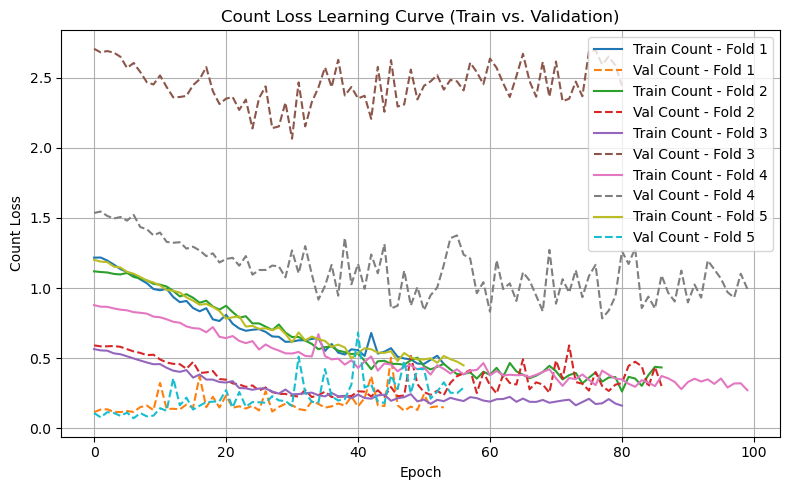

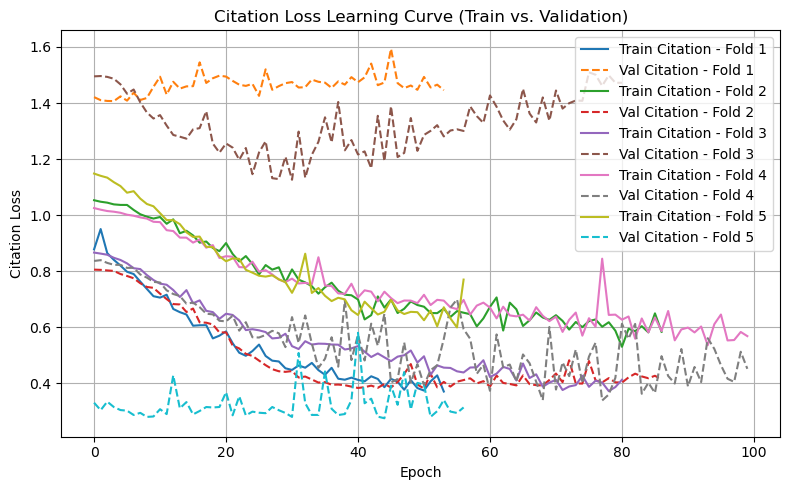

In [ ]:
import matplotlib.pyplot as plt

# Count Loss Learning Curve
plt.figure(figsize=(8, 5))
for fold_id in range(5):
    plt.plot(all_train_losses_count[fold_id], label=f"Train Count - Fold {fold_id+1}")
    plt.plot(all_val_losses_count[fold_id], label=f"Val Count - Fold {fold_id+1}", linestyle='--')
plt.xlabel("Epoch")
plt.ylabel("Count Loss")
plt.title("Count Loss Learning Curve (Train vs. Validation)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Citation Loss Learning Curve
plt.figure(figsize=(8, 5))
for fold_id in range(5):
    plt.plot(all_train_losses_citation[fold_id], label=f"Train Citation - Fold {fold_id+1}")
    plt.plot(all_val_losses_citation[fold_id], label=f"Val Citation - Fold {fold_id+1}", linestyle='--')
plt.xlabel("Epoch")
plt.ylabel("Citation Loss")
plt.title("Citation Loss Learning Curve (Train vs. Validation)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


/tmp/ipykernel_523445/2480264300.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return (tensor * std_array) + mean_array


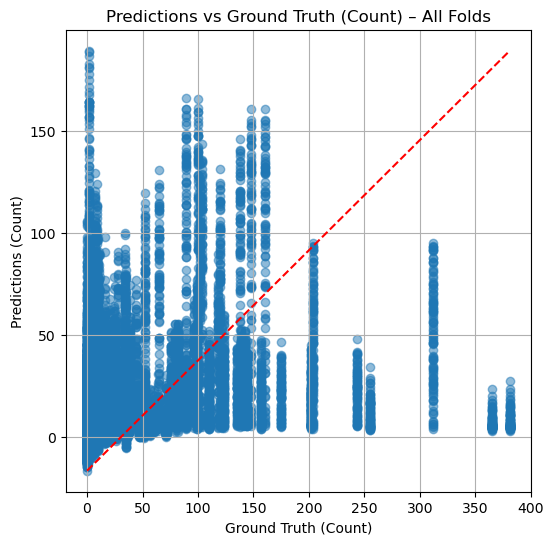

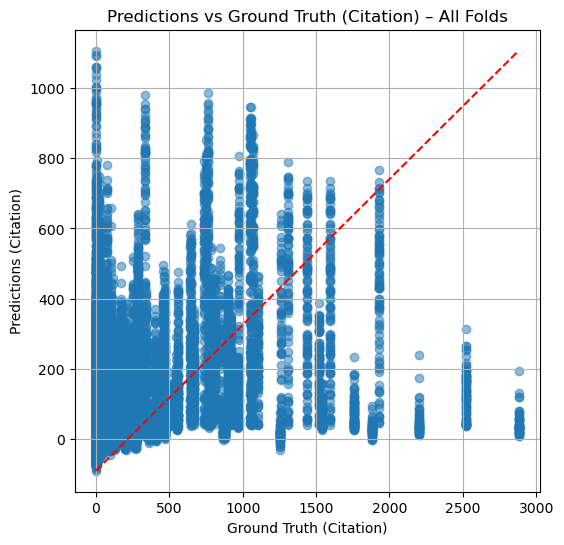

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 合併所有驗證資料
y_pred_all = torch.cat([tensor for fold in all_val_preds_total for tensor in fold])
y_true_all = torch.cat([tensor for fold in all_val_targets_total for tensor in fold])

# 還原 
y_pred_all = unnormalize(y_pred_all, y_mean_array, y_std_array)
y_true_all = unnormalize(y_true_all, y_mean_array, y_std_array)

# Count 圖
plt.figure(figsize=(6, 6))
plt.scatter(y_true_all[:, 0], y_pred_all[:, 0], alpha=0.5)
plt.plot([y_true_all[:, 0].min(), y_true_all[:, 0].max()],
         [y_pred_all[:, 0].min(), y_pred_all[:, 0].max()], 'r--')
plt.xlabel("Ground Truth (Count)")
plt.ylabel("Predictions (Count)")
plt.title("Predictions vs Ground Truth (Count) – All Folds")
plt.grid(True)
plt.show()

# Citation 圖
plt.figure(figsize=(6, 6))
plt.scatter(y_true_all[:, 1], y_pred_all[:, 1], alpha=0.5)
plt.plot([y_true_all[:, 1].min(), y_true_all[:, 1].max()],
         [y_pred_all[:, 1].min(), y_pred_all[:, 1].max()], 'r--')
plt.xlabel("Ground Truth (Citation)")
plt.ylabel("Predictions (Citation)")
plt.title("Predictions vs Ground Truth (Citation) – All Folds")
plt.grid(True)
plt.show()


In [ ]:
print(f"Total number of samples: {y_true_all.shape[0]}")

Total number of samples: 120992


In [ ]:
print(np.log1p(1))

0.6931471805599453
